# CdV Regimes
### HMM:


In [1]:
import cdv_utils
import importlib
importlib.reload(cdv_utils)

<module 'cdv_utils' from '/home/schoelleh96/Nextcloud/AGPfahl/AGMeeting/20241119_PaperClub/code/code_deposit/cdv_utils.py'>

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from cdv_utils import (load_d, build_df, compute_eof, add_density_column,
                       plot_density_heatmap, plot_scatter,
                       analyze_regime_escape_times,
                       fit_hmm, plot_state_modes, escape_times,
                       density_normalized_laplacian)


dims = 6
sample_num = 200000
fixed = np.array([
    [0.7285286,   0.15657308, -0.36810966, -0.32854071, -0.08004622, 0.34314342],
    [0.94484848, 0.10714876, -0.00858286, -0.71094887, -0.17206714, 0.03996197]
])
inits = np.r_[fixed, [(fixed[0] + fixed[1]) / 2]]

In [3]:
state_vector = load_d('./cdv_model/dataOro20.bin', dims, sample_num)
df = build_df(state_vector, dims)
results = compute_eof(df, n_modes=6)
scores_df = results['scores_df']
df = add_density_column(df, state_vector, 0.01)
points_dict = {f'x_{i+1}': fixed[:, i] for i in range(fixed.shape[1])}

Calculated neighbor counts for 200000 points


In [6]:
from scipy.io import savemat
savemat("CdV_short_dt_2e-4.mat", {'state_vector': state_vector})
savemat("CdV_short_dt_2e-4_HMM.mat", {'state_assignment': states})

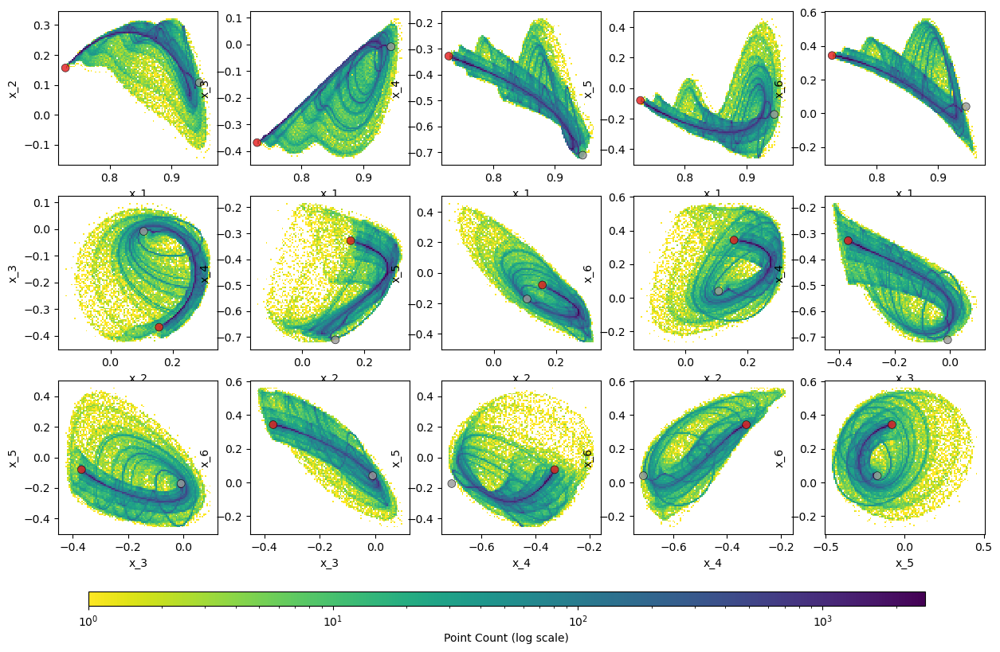

In [4]:
hists = plot_density_heatmap(df, bins=100, points=points_dict)

In [5]:
state_centers, states_sd, states = fit_hmm(
    state_vector, 3, initial_centers=inits)

Transition Matrix:
Shape: (3, 3)
State 1: [0.9410 0.0590 0.0000]
State 2: [0.0387 0.9448 0.0165]
State 3: [0.0216 0.0000 0.9783]



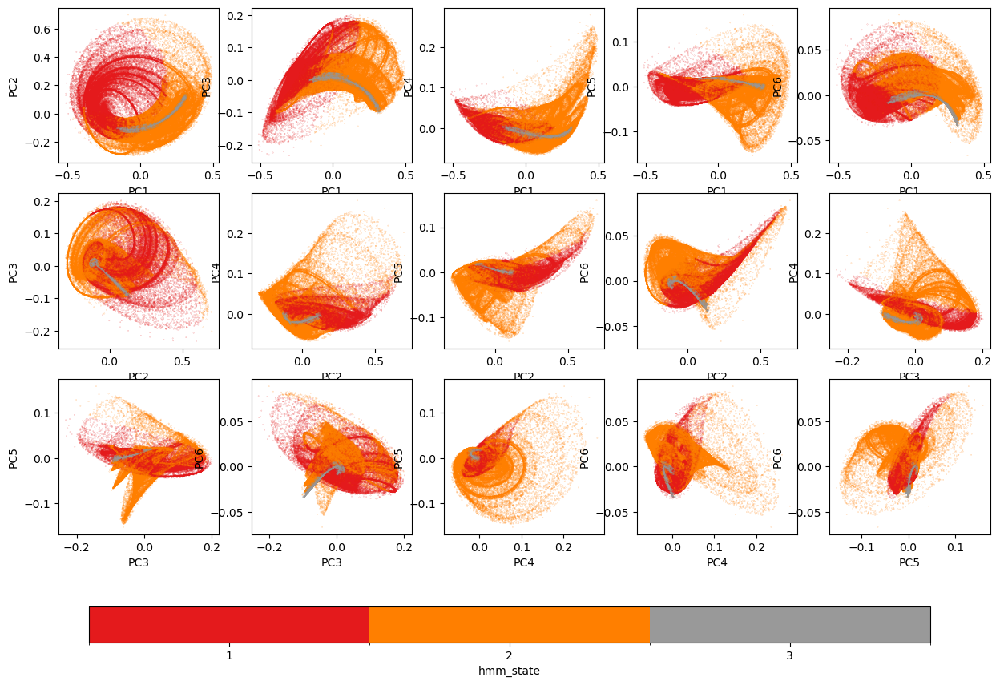

In [23]:
scores_df["hmm_state"] = states
figs, axes = plot_scatter(scores_df, "hmm_state",
                          cmap="Set1", categorical=True)

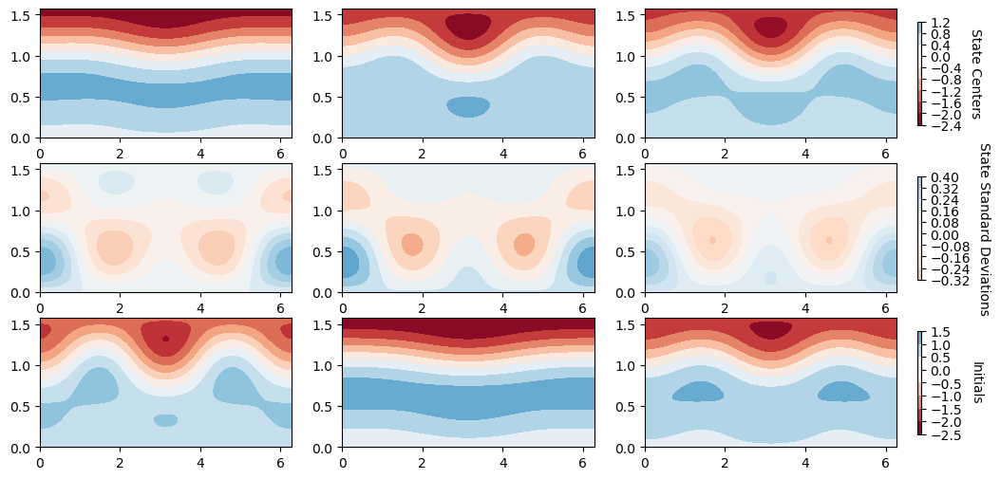

In [7]:
plot_state_modes(state_centers, states_sd, inits)

# Calculate deterministic escape time

Escape Time Statistics:
 state  n_episodes  mean_escape_time  median_escape_time  std_escape_time  min_escape_time  max_escape_time  total_time_in_state
     1        4036         17.213578                18.0         6.235308              1.0             38.0              69474.0
     2        4036         18.367443                18.0         9.502518              2.0             34.0              74131.0
     3        1224         46.074346                20.0        54.071441              2.0            266.0              56395.0

Regime 1 Analysis:
Number of episodes: 4036
Mean escape time: 17.214
Median escape time: 18.000
Std escape time: 6.235

Points in regime 1: 69474
Escape times range: 1.000 to 38.000

Regime 2 Analysis:
Number of episodes: 4036
Mean escape time: 18.367
Median escape time: 18.000
Std escape time: 9.503

Points in regime 2: 74131
Escape times range: 1.000 to 34.000

Regime 3 Analysis:
Number of episodes: 1224
Mean escape time: 46.074
Median escape time: 20.0

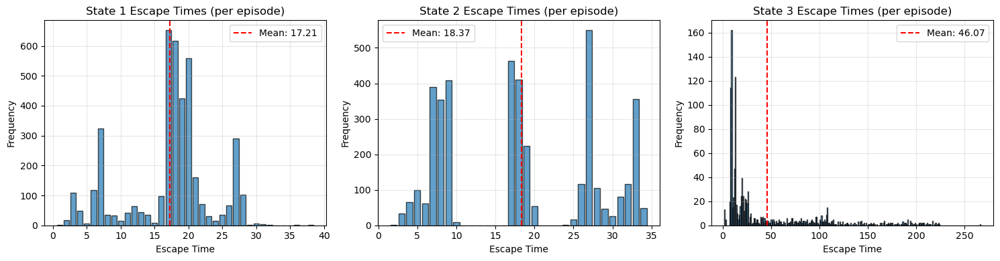

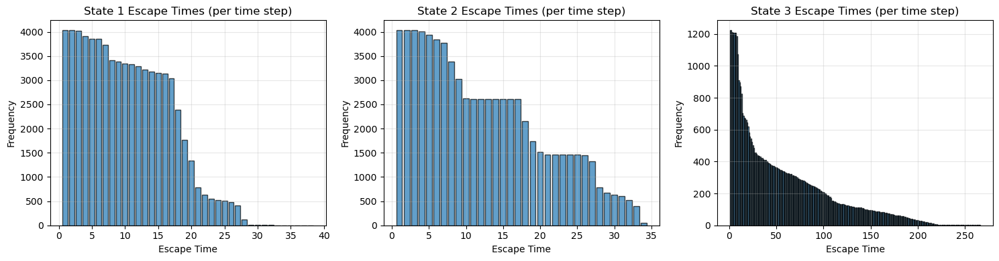

In [8]:
# Run the analysis on your HMM results:
results = analyze_regime_escape_times(states, dt=1.0)

In [21]:
escapes = escape_times(states)
escapes.shape

(200000,)

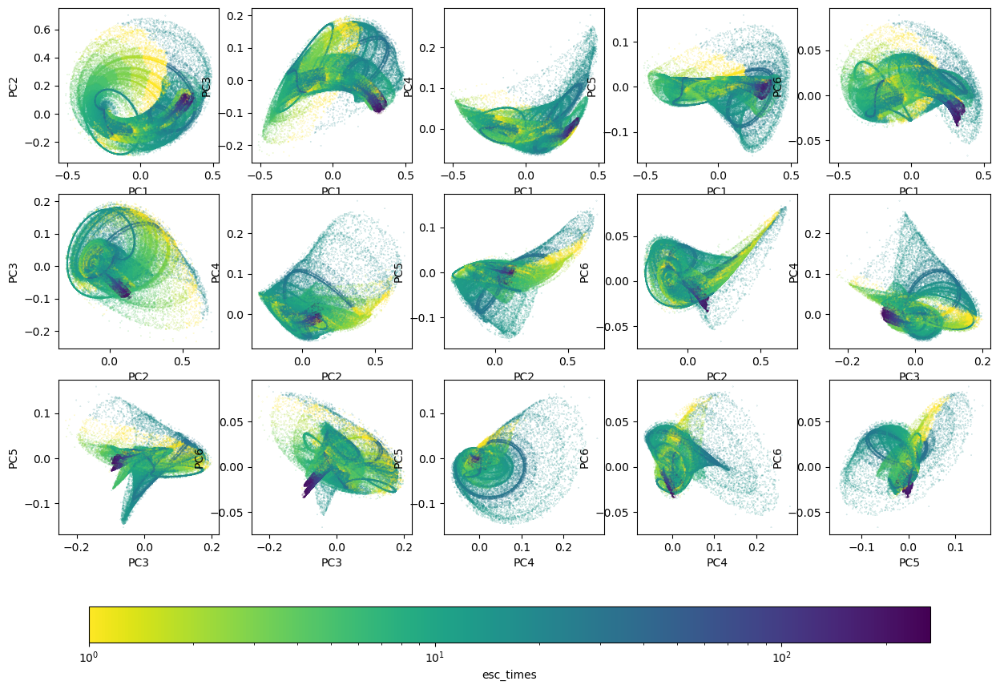

In [17]:
from matplotlib.colors import LogNorm, BoundaryNorm

scores_df["esc_times"] = escapes
figs, axes = plot_scatter(scores_df, "esc_times", norm=LogNorm())

## Graph Laplacian Smoothing of Class Assignments

This function smooths discrete class labels over a set of points by diffusing label information through a similarity graph. 

1. **Graph Construction**  
   - Given points $X = \{x_1, \ldots, x_n\} \subset \mathbb{R}^d$, build a weighted graph $G = (V, E)$ where edges connect $k$ nearest neighbors.
   - Edge weights are computed using a Gaussian kernel:  
     $$
     w_{ij} = \exp\left( -\frac{\|x_i - x_j\|^2}{2\sigma^2} \right)
     $$
   - The adjacency matrix $A$ is symmetrized: $A = \frac{A + A^\top}{2}$.

2. **Laplacian Assembly**  
   - Degree matrix: $D_{ii} = \sum_j A_{ij}$
   - Unnormalized graph Laplacian:  
     $$
     L = D - A
     $$

3. **Label Encoding**  
   - Given integer class labels $y_i \in \{1, \ldots, C\}$, construct one-hot matrix $Y \in \mathbb{R}^{n \times C}$ where $Y_{ic} = 1$ if $y_i$ belongs to class $c$.

4. **Regularized Solve**  
   - Solve for smoothed class scores $F \in \mathbb{R}^{n \times C}$:  
     $$
     (I + \lambda L) F = Y
     $$
   - The parameter $\lambda \geq 0$ controls smoothing strength.
   - This  minimizes the following functional (by letting $\partial \mathcal{E}/\partial F = 0$):

$$\mathcal{E}(F)
= \underbrace{\frac{1}{2} \sum_{i,j} w_{ij} \,\bigl\lVert F_{i\cdot} - F_{j\cdot} \bigr\rVert^2}_{\text{smoothness penalty}}
\;+\;
\underbrace{\frac{1}{2\lambda} \sum_{i} \bigl\lVert F_{i\cdot} - Y_{i\cdot} \bigr\rVert^2}_{\text{fidelity to data}}
$$

5. **Label Re-assignment**  
   - Compute final labels by:  
     $$
     \hat{y}_i = \arg\max_{c} F_{ic}
     $$


In [8]:
for sp in np.logspace(0, 4, 5):
    smoothed_graph = smooth_assignments_graph_laplacian(
        state_vector, states, k_neighbors=50, smoothing_param=sp)
    print(f"smoothing parameter: {sp}")
    print(f"No assignment changes: {np.all(states == smoothed_graph)}")
    print(f"{np.sum(states != smoothed_graph)} points changed regime")

smoothing parameter: 1.0
No assignment changes: False
927 points changed regime
smoothing parameter: 10.0
No assignment changes: False
4449 points changed regime
smoothing parameter: 100.0
No assignment changes: False
11170 points changed regime
smoothing parameter: 1000.0
No assignment changes: False
21524 points changed regime
smoothing parameter: 10000.0
No assignment changes: False
30764 points changed regime


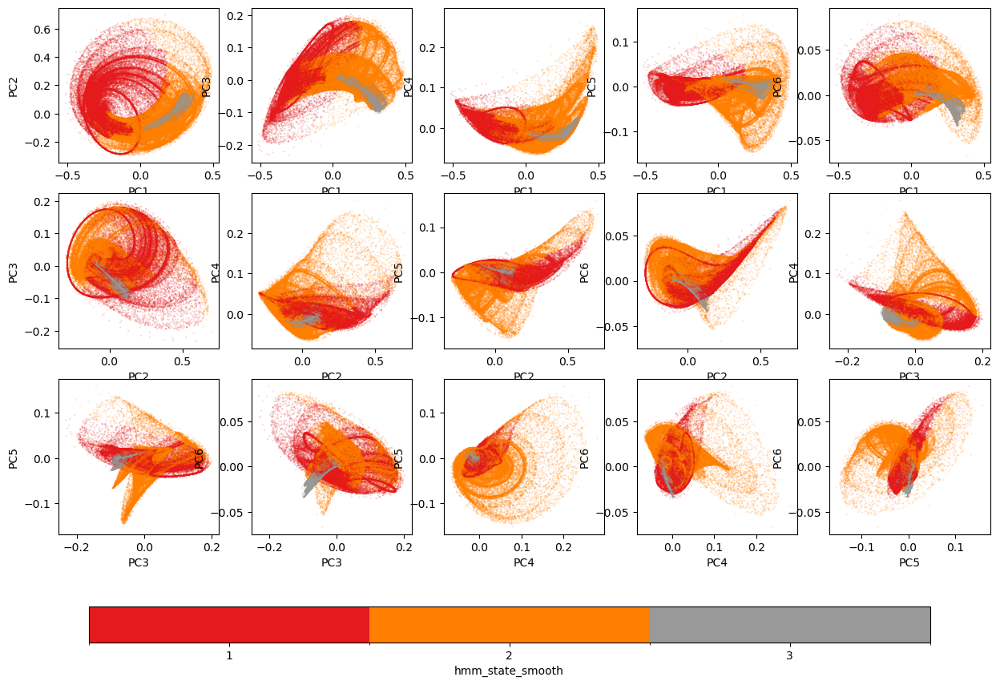

In [9]:
scores_df["hmm_state_smooth"] = smoothed_graph
figs, axes = plot_scatter(scores_df, "hmm_state_smooth",
                          cmap="Set1", categorical=True)

Escape Time Statistics:
 state  n_episodes  mean_escape_time  median_escape_time  std_escape_time  min_escape_time  max_escape_time  total_time_in_state
     1        3536         22.190045                23.0         8.786692              1.0             46.0              78464.0
     2        4224         16.900568                16.0         8.191168              1.0             35.0              71388.0
     3         689         72.783745                56.0        61.087826              1.0            268.0              50148.0

Regime 1 Analysis:
Number of episodes: 3536
Mean escape time: 22.190
Median escape time: 23.000
Std escape time: 8.787

Points in regime 1: 78464
Escape times range: 1.000 to 46.000

Regime 2 Analysis:
Number of episodes: 4224
Mean escape time: 16.901
Median escape time: 16.000
Std escape time: 8.191

Points in regime 2: 71388
Escape times range: 1.000 to 35.000

Regime 3 Analysis:
Number of episodes: 689
Mean escape time: 72.784
Median escape time: 56.00

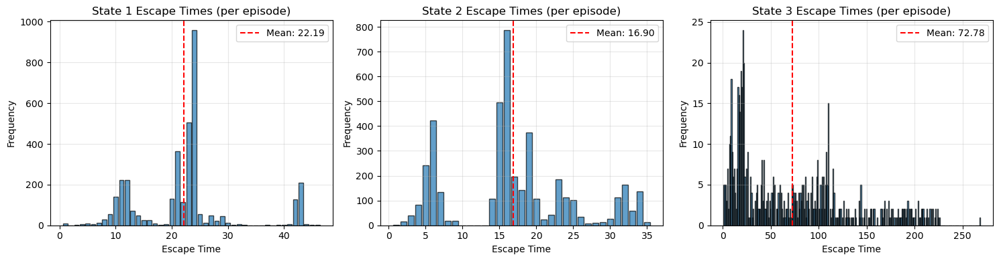

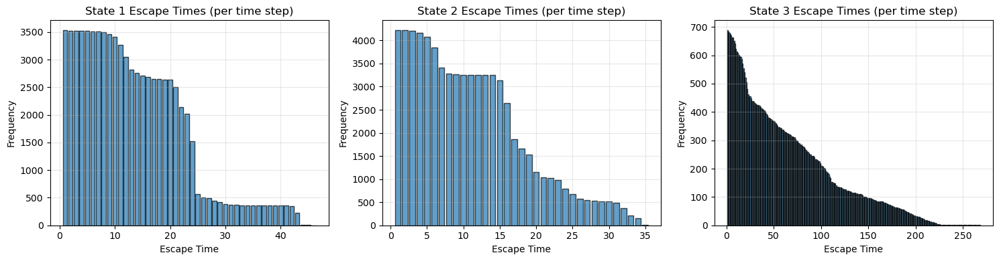

In [12]:
results = analyze_regime_escape_times(smoothed_graph, dt=1.0)

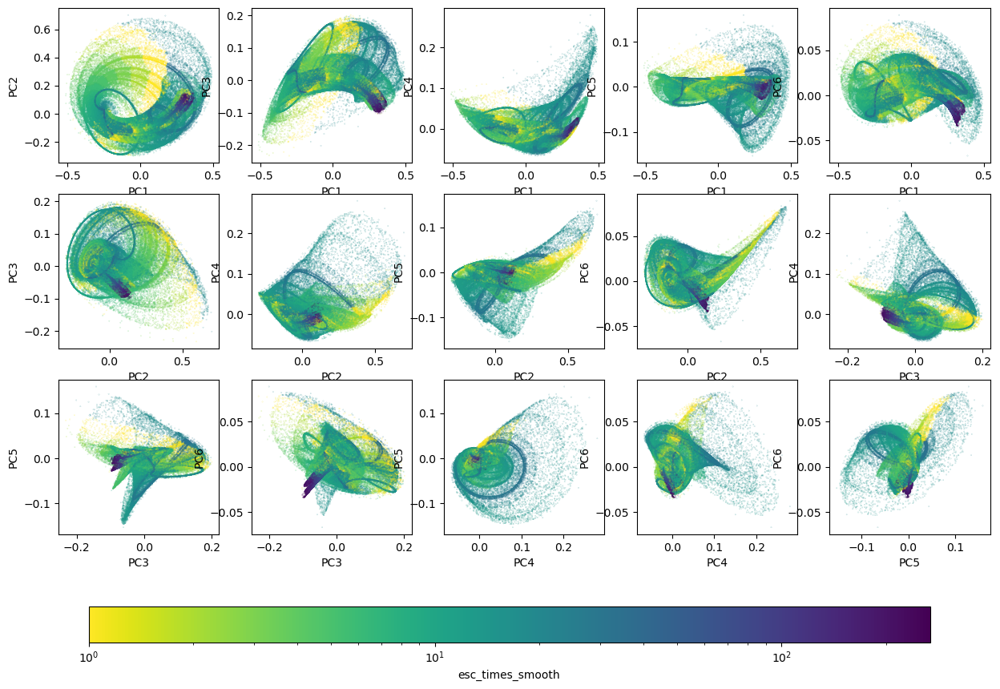

In [20]:
escapes_smooth = escape_times(smoothed_graph)
scores_df["esc_times_smooth"] = escapes_smooth
figs, axes = plot_scatter(scores_df, "esc_times_smooth", norm=LogNorm())

### Now the Laplacian of the escape time

In [25]:
from matplotlib.colors import Normalize
scores_df["lap"] = 0.0
scores_df["lap_smooth"] = 0.0

for i in np.unique(states):
    mask = scores_df["hmm_state"] == i
    lap_value = density_normalized_laplacian(
        state_vector[states == i], escapes[states == i], k=100)
    scores_df.loc[mask, "lap"] = lap_value

    smooth_mask = scores_df["hmm_state_smooth"] == i
    lap_smooth_value = density_normalized_laplacian(
        state_vector[smoothed_graph == i], escapes_smooth[smoothed_graph == i], k=100)
    scores_df.loc[smooth_mask, "lap_smooth"] = lap_smooth_value

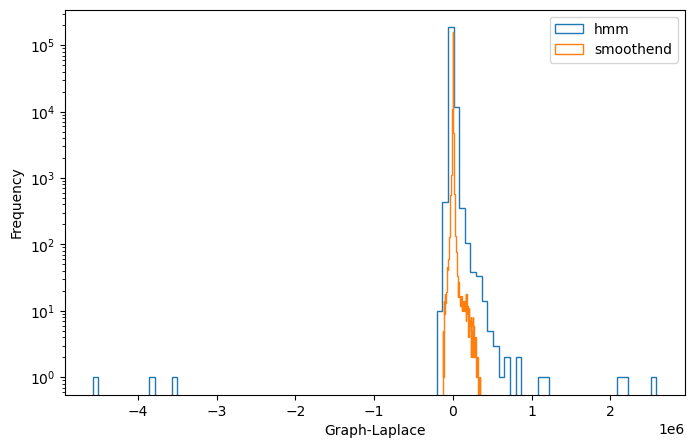

In [27]:
plt.figure(figsize=(8, 5))

plt.hist(scores_df['lap'], bins=100, histtype='step', label="hmm")
plt.hist(scores_df['lap_smooth'], bins=100, histtype='step', label="smoothend")

plt.yscale("log")
plt.xlabel("Graph-Laplace")
plt.ylabel("Frequency")
plt.legend()

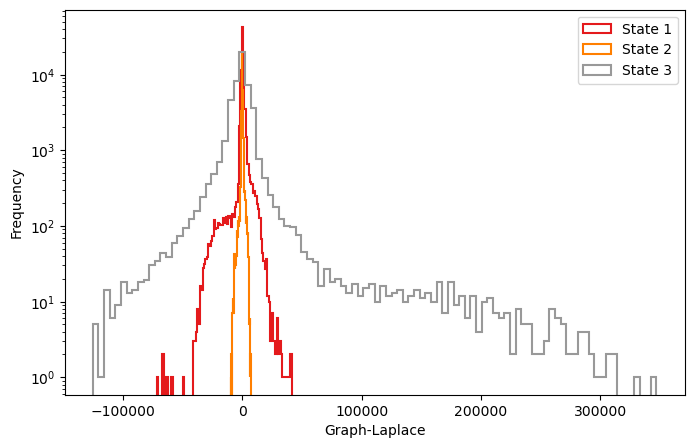

In [33]:
plt.figure(figsize=(8, 5))
cmap = plt.get_cmap('Set1')

# Sample 3 colors from the colormap
colors = [cmap(i) for i in [0, 4, 8]]
for state, color in zip(np.unique(states), colors):
    data = scores_df[scores_df["hmm_state_smooth"] == state]['lap_smooth']
    plt.hist(
        data,
        bins=100,
        histtype='step',       # draw outlines only
        linewidth=1.5,
        color=color,
        label=f'State {state}'
    )
    # mean_val = data.mean()
    # plt.axvline(
    #     mean_val,
    #     linestyle='--',
    #     linewidth=1.5,
    #     color=color,
    #     label=f'State {state} mean'
    # )
plt.yscale("log")
plt.xlabel("Graph-Laplace")
plt.ylabel("Frequency")
plt.legend()

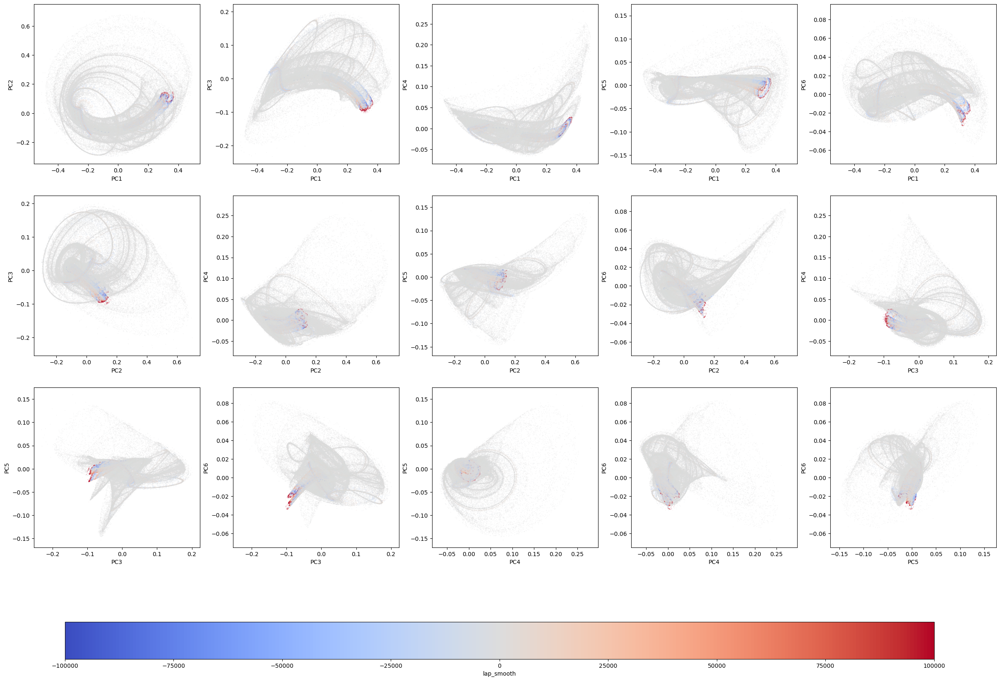

In [28]:

# Create a Normalize object with the desired limits
norm = Normalize(vmin=-1e5, vmax=1e5)

figs, axes = plot_scatter(
    scores_df, "lap_smooth", norm=norm, size=2, cmap="coolwarm")

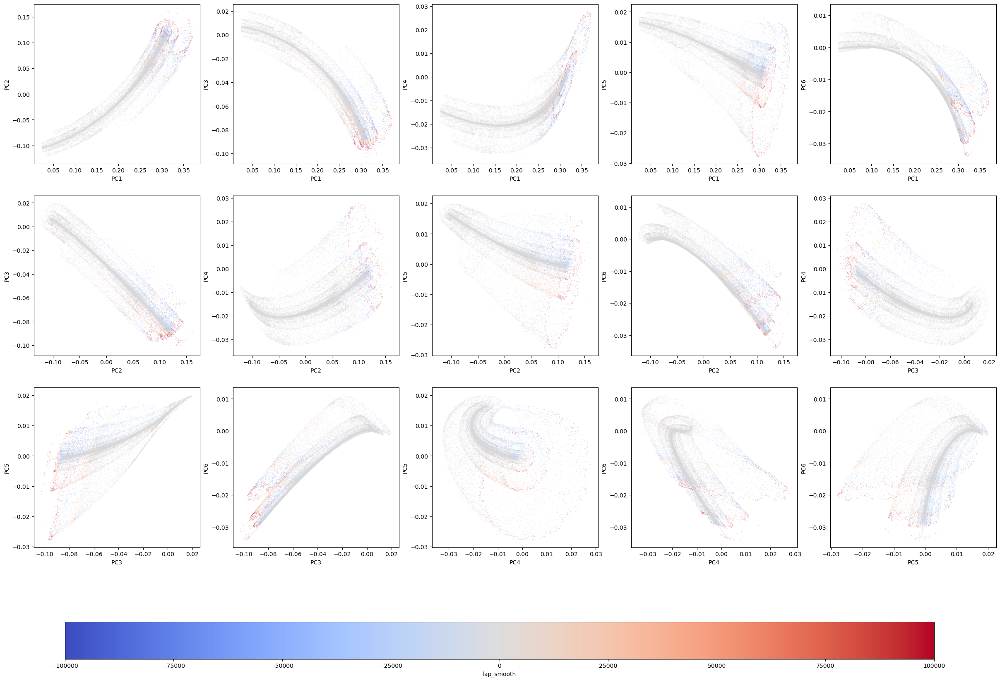

In [32]:
figs, axes = plot_scatter(
    scores_df[(scores_df["hmm_state_smooth"] == 3)], "lap_smooth", norm=norm, size=2, cmap="coolwarm")

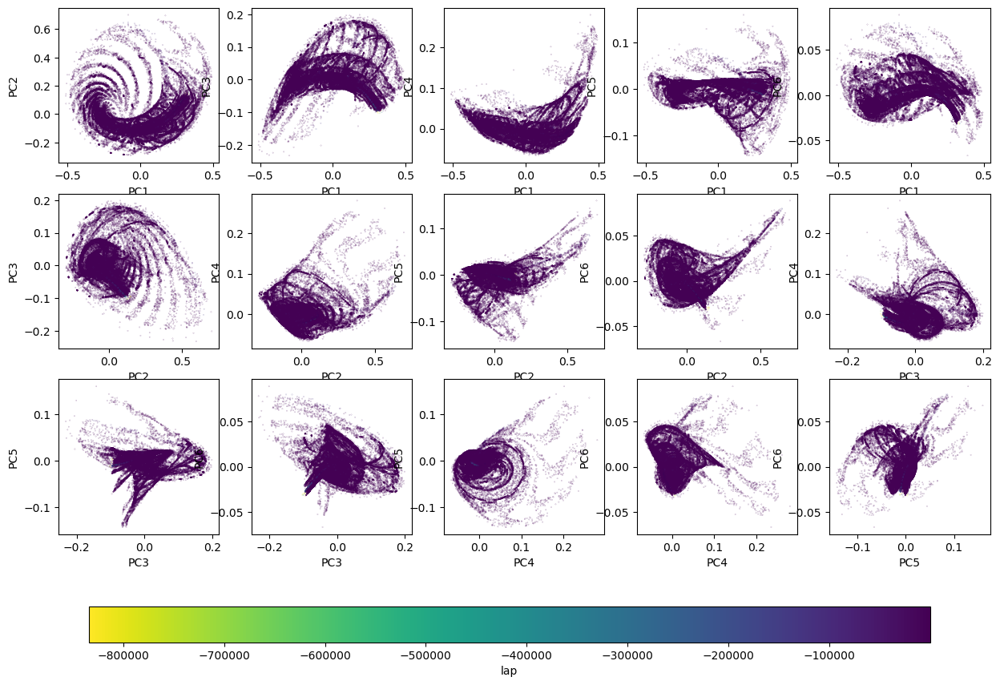

In [20]:
figs, axes = plot_scatter(
    scores_df[scores_df['lap'] < -1e-6], "lap", norm=None)

## Try with more data

In [3]:
N_lim = 10000000
combined_data = load_d("./cdv_model/dataOro20_Large.bin",
                       6, 500000*99)[:N_lim, :]
df_Large = build_df(combined_data, dims)
# hists = plot_density_heatmap(df_Large, bins=500, points=points_dict)

In [4]:
combined_data.shape

(10000000, 6)

In [39]:
state_centers, states_sd, states = fit_hmm(
    combined_data, 3, initial_centers=inits)

KeyboardInterrupt: 

In [62]:
import pickle
with open("HMM_Large.pkl", "wb") as f:
    pickle.dump((state_centers, states_sd, states), f)

In [8]:
import pickle

with open("HMM_Large.pkl", "rb") as f:
    state_centers, states_sd, states = pickle.load(f)

In [ ]:
savemat("CdV_long_dt_1e-5.mat", {'state_vector': combined_data})
savemat("CdV_long_dt_1e-5_HMM.mat", {'state_assignment': states})

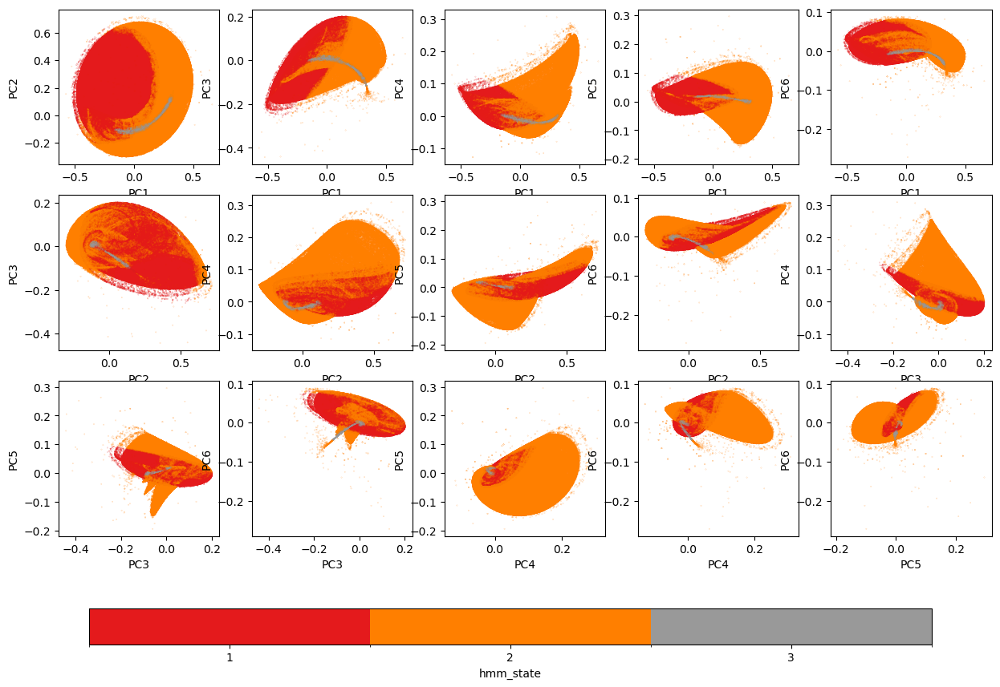

In [36]:
results = compute_eof(df_Large, n_modes=6)
scores_df_Large = results['scores_df']
scores_df_Large["hmm_state"] = states
figs, axes = plot_scatter(scores_df_Large, "hmm_state",
                          cmap="Set1", categorical=True)

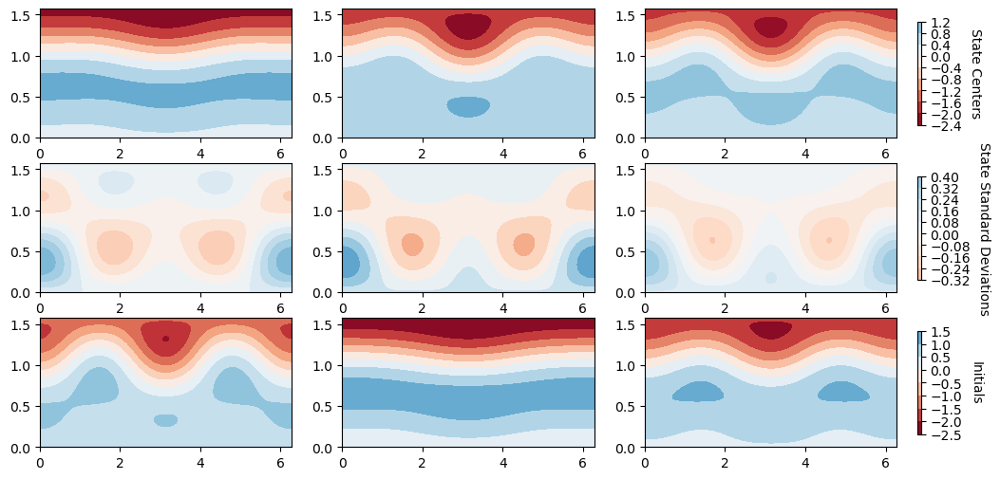

In [65]:
plot_state_modes(state_centers, states_sd, inits)

Escape Time Statistics:
 state  n_episodes  mean_escape_time  median_escape_time  std_escape_time  min_escape_time  max_escape_time  total_time_in_state
     2      203175         18.243332                18.0         9.656378              2.0            135.0            3706589.0
     3       60701         46.874071                20.0        54.984718              2.0            353.0            2845303.0
     1      203153         16.972961                18.0         6.354193              2.0             45.0            3448108.0

Regime 2 Analysis:
Number of episodes: 203175
Mean escape time: 18.243
Median escape time: 18.000
Std escape time: 9.656

Points in regime 2: 3706589
Escape times range: 1.000 to 135.000

Regime 3 Analysis:
Number of episodes: 60701
Mean escape time: 46.874
Median escape time: 20.000
Std escape time: 54.985

Points in regime 3: 2845303
Escape times range: 1.000 to 353.000

Regime 1 Analysis:
Number of episodes: 203153
Mean escape time: 16.973
Median escap

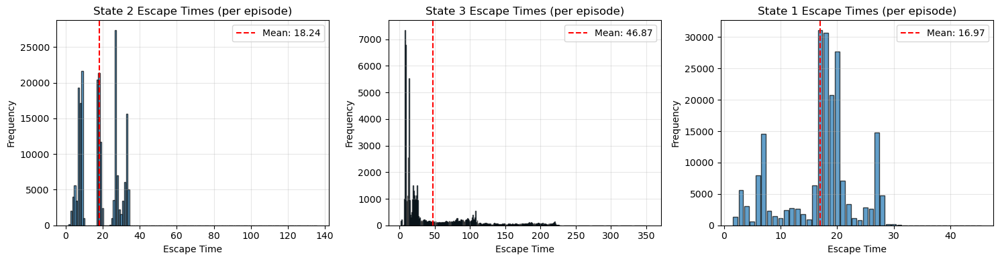

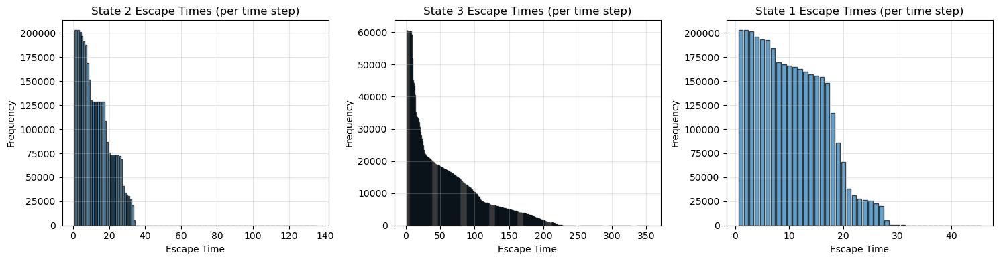

In [43]:
results = analyze_regime_escape_times(states, dt=1.0)
escapes = escape_times(states)

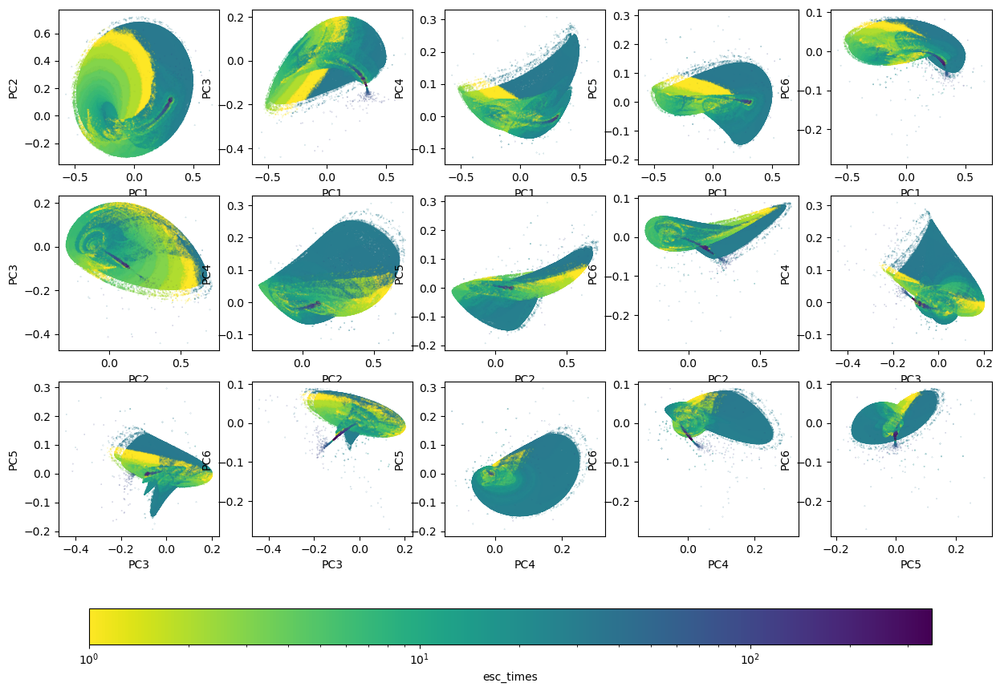

In [ ]:
scores_df_Large["esc_times"] = escapes
figs, axes = plot_scatter(scores_df_Large, "esc_times", norm=LogNorm(), size=2)

In [44]:
lap = density_normalized_laplacian(
    combined_data[states == 3], escapes[states == 3], k=100)

In [46]:
scores_df_Large["lap"] = 0

/tmp/ipykernel_5376/2382311874.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scores_df_Large[scores_df_Large["hmm_state"] == 3]["lap"] = lap


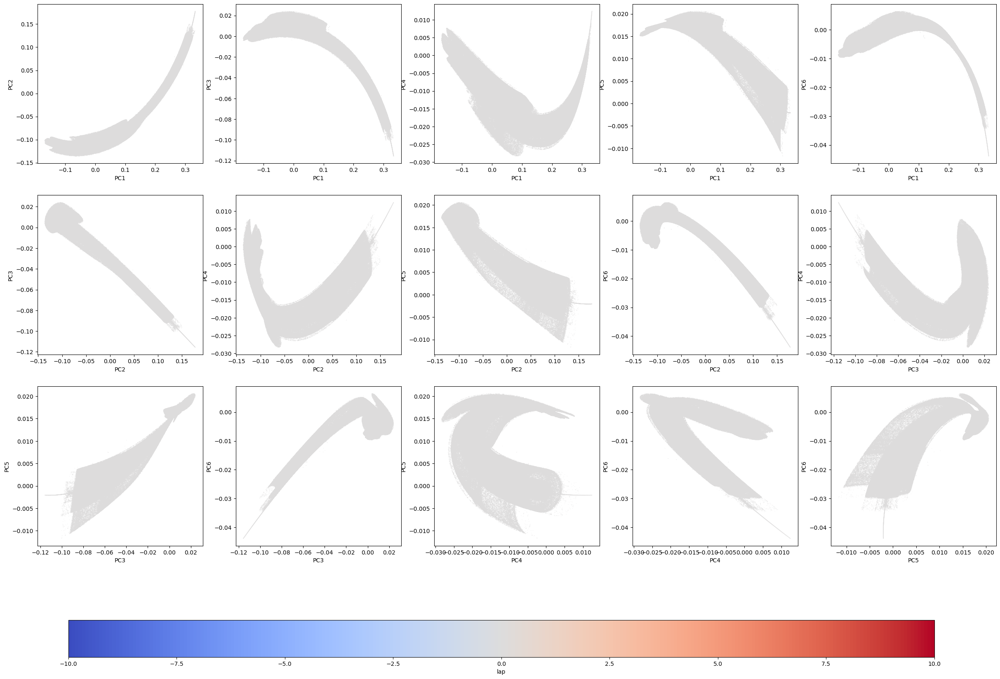

In [47]:
scores_df_Large[scores_df_Large["hmm_state"] == 3]["lap"] = lap

# Create a Normalize object with the desired limits
norm = Normalize(vmin=-10, vmax=10)

figs, axes = plot_scatter(
    scores_df_Large[(scores_df_Large["hmm_state"] == 3)], "lap", norm=norm, size=2, cmap="coolwarm")

In [17]:
lap = density_normalized_laplacian(combined_data, escapes, k=50)

/tmp/ipykernel_21013/273802659.py:58: RuntimeWarning: divide by zero encountered in divide
  inv_sqrt_d = 1.0 / np.sqrt(d_raw)


In [18]:
with open("Large_lap.pkl", "wb") as f:
    pickle.dump(lap, f)

In [8]:
with open("Large_lap.pkl", "rb") as f:
    lap = pickle.load(f)

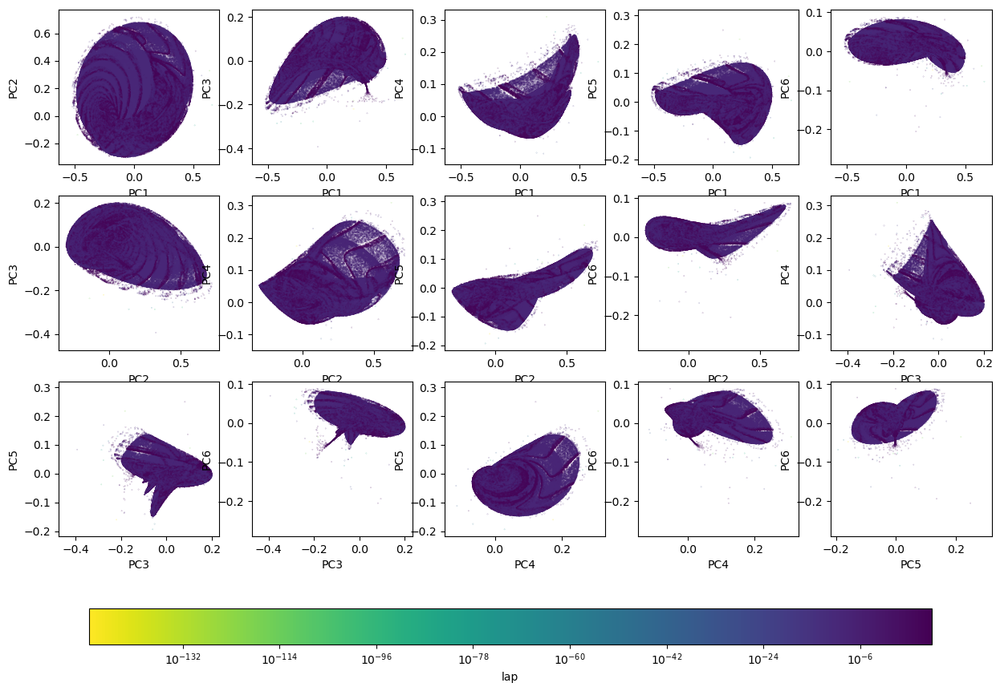

In [81]:

scores_df_Large["lap"] = lap

figs, axes = plot_scatter(scores_df_Large, "lap", norm=None)  # LogNorm())

Text(0, 0.5, 'Frequency')

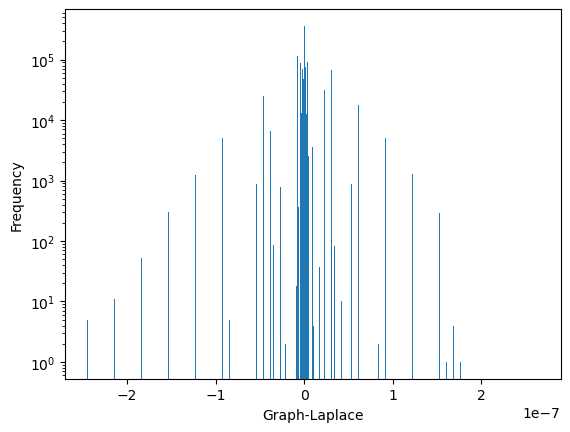

In [53]:
plt.hist(lap[np.abs(lap) < 1e-6], bins=1000)
plt.yscale("log")
plt.xlabel("Graph-Laplace")
plt.ylabel("Frequency")

(np.float64(0.8941176470588236), np.float64(0.10196078431372549), np.float64(0.10980392156862745), np.float64(1.0))
(np.float64(1.0), np.float64(0.4980392156862745), np.float64(0.0), np.float64(1.0))
(np.float64(0.6), np.float64(0.6), np.float64(0.6), np.float64(1.0))


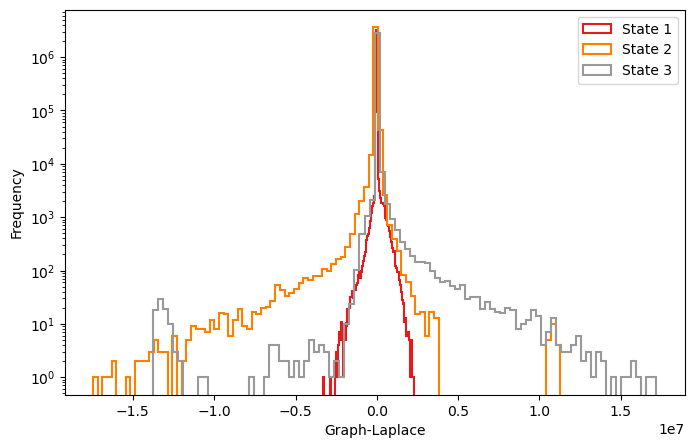

In [22]:
plt.figure(figsize=(8, 5))
cmap = plt.get_cmap('Set1')

# Sample 3 colors from the colormap
colors = [cmap(i) for i in [0, 4, 8]]
for state, color in zip(np.unique(states), colors):
    print(color)
    data = lap[states == state]
    plt.hist(
        data,
        bins=100,
        histtype='step',       # draw outlines only
        linewidth=1.5,
        color=color,
        label=f'State {state}'
    )
    # mean_val = data.mean()
    # plt.axvline(
    #     mean_val,
    #     linestyle='--',
    #     linewidth=1.5,
    #     color=color,
    #     label=f'State {state} mean'
    # )
plt.yscale("log")
plt.xlabel("Graph-Laplace")
plt.ylabel("Frequency")
plt.legend()

### find roots

In [28]:
import numpy as np
from scipy.optimize import root

# ⇢ coefficient lambdas (m=1,2)


def a(m, b): return 8*np.sqrt(2)*m*m * \
    (b*b + m*m - 1)/(np.pi*(4*m*m - 1)*(b*b + m*m))


def beta_C(m, b, beta): return beta*b*b/(b*b + m*m)
def gamma_C(m, b, g): return 4*g*np.sqrt(2)*b * \
    m**3/(np.pi*(4*m*m - 1)*(b*b + m*m))


def gamma_P(m, b, g): return 4*g*np.sqrt(2)*b*m / (np.pi*(4*m*m - 1))
def d(m, b): return 64*np.sqrt(2)*(b*b - m*m + 1)/(15*np.pi*(b*b + m*m))


def get_coeffs(b, beta, g):
    """Build the 11-entry coefficient array."""
    m_vals = [1, 2]
    return np.array([
        a(m_vals[0], b), a(m_vals[1], b),
        beta_C(m_vals[0], b, beta), beta_C(m_vals[1], b, beta),
        gamma_C(m_vals[0], b, g), gamma_C(m_vals[1], b, g),
        gamma_P(m_vals[0], b, g), gamma_P(m_vals[1], b, g),
        d(m_vals[0], b), d(m_vals[1], b),
        16*np.sqrt(2)/(5*np.pi)
    ])


def build_lin_op(coeff, C):
    """Build the 6×6 linear operator matrix."""
    M = -C * np.eye(6)
    # (row, col, coeff_index, sign)
    updates = [
        (0, 2, 6, +1), (1, 2, 2, +1),
        (2, 0, 4, -1), (2, 1, 2, -1),
        (3, 5, 7, +1), (4, 5, 3, +1),
        (5, 3, 5, -1), (5, 4, 3, -1),
    ]
    for i, j, k, sgn in updates:
        M[i, j] = sgn * coeff[k]
    return M


# — User-supplied parameters —
xf = np.array([0.95, 0.0, 0.0, -0.76095, 0.0, 0.0])  # forcing vector
C = 0.1       # forcing magnitude
beta_ = 1.25      # strength of coriolis terms
b = 0.5       # geometry parameter
g = 0.2       # topographical height
e = 16 * np.sqrt(2) / (5 * np.pi)

# Build coefficients and linear operator
coeff = get_coeffs(b, beta_, g)
lin_op = build_lin_op(coeff, C)

# Extract some coeffs for nonlinear terms
a1, a2 = coeff[0], coeff[1]
d1, d2 = coeff[8], coeff[9]


def dxdt(x):
    """RHS of ODE: lin_op·x + C·xf + nonlinear terms."""
    out = lin_op.dot(x) + C*xf
    nl = np.array([
        0.0,
        -a1*x[0]*x[2] - d1*x[3]*x[5],
        a1*x[0]*x[1] + d1*x[3]*x[4],
        e*(x[1]*x[5] - x[2]*x[4]),
        -a2*x[0]*x[5] - d2*x[2]*x[3],
        a2*x[0]*x[4] + d2*x[1]*x[3],
    ])
    return out + nl


def jac(x):
    """Analytic Jacobian of dxdt."""
    J = lin_op.copy()
    # row 2 (index 1)
    J[1, 0] -= a1*x[2]
    J[1, 2] -= a1*x[0]
    J[1, 3] -= d1*x[5]
    J[1, 5] -= d1*x[3]
    # row 3 (index 2)
    J[2, 0] += a1*x[1]
    J[2, 1] += a1*x[0]
    J[2, 3] += d1*x[4]
    J[2, 4] += d1*x[3]
    # row 4 (index 3)
    J[3, 1] += e*x[5]
    J[3, 2] -= e*x[4]
    J[3, 4] -= e*x[2]
    J[3, 5] += e*x[1]
    # row 5 (index 4)
    J[4, 0] -= a2*x[5]
    J[4, 2] -= d2*x[3]
    J[4, 3] -= d2*x[2]
    J[4, 5] -= a2*x[0]
    # row 6 (index 5)
    J[5, 0] += a2*x[4]
    J[5, 1] += d2*x[3]
    J[5, 3] += d2*x[1]
    J[5, 4] += a2*x[0]
    return J


# Initial guess and solver
# x0 = np.array([
#     0.927796,
#     0.160574,
#     -0.0969953,
#     -0.672758,
#     -0.118184,
#     0.214505
# ])
x0 = np.array([.93, .11, 0, -.7, -.2, .05])
# sol = root(dxdt, x0, jac=jac, tol=1e-12)
sol = root(dxdt, x0, jac=jac, method='lm',
           tol=1e-12, options={'maxiter': 500})
# sol = root(dxdt, x0, jac=jac, method='broyden1', tol=1e-12)
if sol.success:
    print("Solution x* =", sol.x)
else:
    print("Solver failed:", sol.message)

Solution x* = [ 0.94484848  0.10714876 -0.00858286 -0.71094887 -0.17206714  0.03996197]
